In [255]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import random
import plotly.graph_objects as go
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor, RandomForestClassifier
from xgboost import XGBRegressor

random.seed(1)

In [257]:
df = pd.read_csv('Health_data_cleaned.csv')
df.drop(["Unnamed: 0"], axis=1, inplace=True)
df.columns

Index(['Sex', 'Education_Level', 'Household_Income', 'Veteran', 'Age',
       'High_Blood_Pressure', 'Blood_Pressure_Meds', 'High_Cholesterol',
       'Heart_Attack', 'Angina/Heart_Disease', 'Stroke', 'Asthma_(ever)',
       'Asthma_(currently)', 'Skin_Cancer', 'Cancer_(not skin)',
       'COPD_emphasema_chronic_bronchitis',
       'Arthritis_RA_gout_lupus_fibromyalgia', 'Depression', 'Kidney_Disease',
       'Diabetes', 'Smoker', 'Days_at_least_1_drink_recently',
       'Binge_Drinking_last_30_days', 'Chewing_tobacco', 'Any_Excercise',
       'Strength_Excercise', 'Aerobic_Excercise', 'Daily_Fruit_Juice',
       'Daily_Fruits', 'Daily_Beans', 'Daily_Green_Veg', 'Daily_Orange_Veg',
       'Daily_Other_Veg', 'BMI', 'Has_Health_Coverage',
       'Could_not_afford_to_see_doctor', 'General_Health_Self_Rating',
       'Poor_Mental_Health', 'Poor_Physical_Health',
       'Kept_from_doing_activities', 'Limited_Activities',
       'Uses_Special_Equipment', 'Difficulty_Concentrating',
       'D

In [258]:
X = df.drop("Heart_Attack",axis=1)
y = df.Heart_Attack

X_train, X_test, y_train, y_test = train_test_split(X, y)

## Random Forest Regressor

In [262]:
rfr = RandomForestRegressor()
rfr.fit(X_train, y_train)

RandomForestRegressor()

In [264]:
y_preds = rfr.predict(X_test)
mean_absolute_error(y_preds, y_test), mean_squared_error(y_preds, y_test), mean_squared_log_error(y_preds, y_test)

(0.07930446306429549, 0.03748537534199727, 0.01891624856759811)

In [73]:
preds = pd.Series(y_preds)

In [83]:
preds_index = pd.Series(y_preds, index=y_test.index)

In [89]:
combined = pd.concat([y_test, preds_index], axis=1)

In [91]:
combined.head()

,Heart_Attack,0
273231,0.0,0.01
194553,0.0,0.05
184690,0.0,0.00
123083,0.0,0.26
124132,0.0,0.02


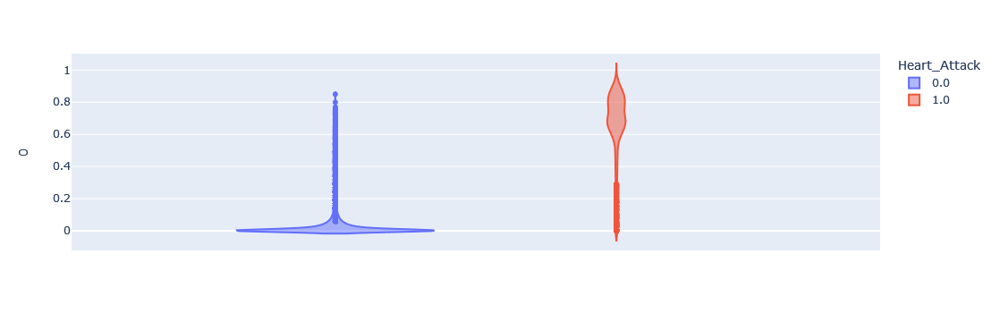

In [93]:
px.violin(combined, y=0, color="Heart_Attack")

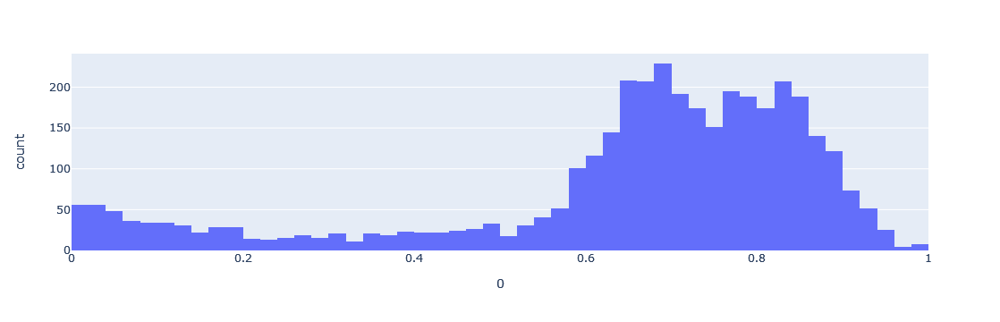

In [101]:
px.histogram(combined[combined.Heart_Attack ==1], x=0)

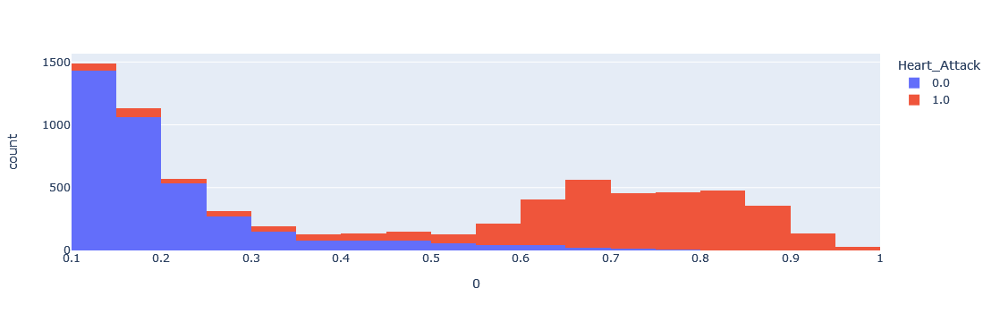

In [205]:
px.histogram(combined[combined[0] > 0.1], x=0, nbins=18, color="Heart_Attack")

In [251]:
# ranges = [0,10,20,30,40,50,60,70,80,90,100]
# df.groupby(pd.cut(df.a, ranges)).count()
#combined[combined["Heart_Attack"] == 1].groupby([0].cut).count()
pd.cut(combined[combined["Heart_Attack"]==1][0], bins=[0,.1,.2,.3,.4,.5,.6,.7,.8,.9,1])

3684

In [253]:
positive = combined[combined["Heart_Attack"]==1]
negative = combined[combined["Heart_Attack"]==0]
 pd.cut(positive[0], bins=5)

C:\Users\mtyle\AppData\Local\Temp\ipykernel_26976\2686627777.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



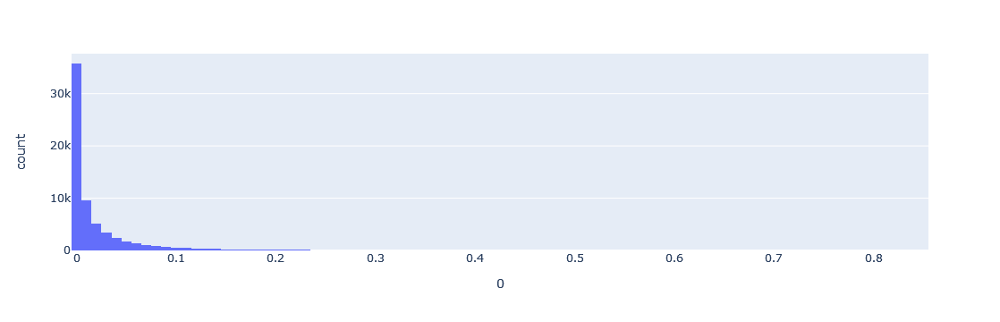

In [103]:
px.histogram(combined[combined.Heart_Attack ==0], x=0)

In [108]:
knr = KNeighborsRegressor()
knr.fit(X_train, y_train)

KNeighborsRegressor()

In [112]:
y_preds = knr.predict(X_test)
mean_absolute_error(y_preds, y_test), mean_squared_error(y_preds, y_test), mean_squared_log_error(y_preds, y_test)

(0.08344733242134063, 0.05272799817601459, 0.027095535977097594)

## SGDRegressor

In [119]:
sgd = SGDRegressor(max_iter=2000)
sgd.fit(X_train, y_train)

C:\Users\mtyle\anaconda3\Lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1548: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.



SGDRegressor(max_iter=2000)

In [123]:
y_preds = sgd.predict(X_test)
mean_absolute_error(y_preds, y_test), mean_squared_error(y_preds, y_test), #mean_squared_log_error(y_preds, y_test)

(1397.2532722694975, 3174149.086764234)

# HistGradientBoostingRegressor

In [126]:
hgbr = HistGradientBoostingRegressor()
hgbr.fit(X_train, y_train)

HistGradientBoostingRegressor()

In [130]:
y_preds = hgbr.predict(X_test)
mean_absolute_error(y_preds, y_test), mean_squared_error(y_preds, y_test), #mean_squared_log_error(y_preds, y_test)

(0.07269269751709183, 0.03649467708746166)

# GradientBoostingRegressor

In [133]:
gbr = GradientBoostingRegressor()
gbr.fit(X_train, y_train)

GradientBoostingRegressor()

In [135]:
y_preds = gbr.predict(X_test)
mean_absolute_error(y_preds, y_test), mean_squared_error(y_preds, y_test)

(0.07430352562869529, 0.036530142507992316)

# XGBoostRegressor

In [138]:
xgb = XGBRegressor()
xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [140]:
y_preds = xgb.predict(X_test)
mean_absolute_error(y_preds, y_test), mean_squared_error(y_preds, y_test)

(0.0745644599436953, 0.03759632824765965)

In [144]:
preds_index = pd.Series(y_preds, index=y_test.index)
xgb_combined = pd.concat([y_test, preds_index], axis=1)

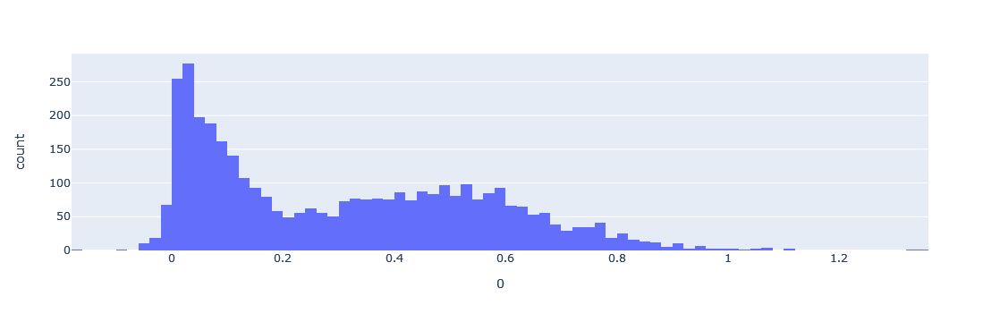

In [146]:
px.histogram(xgb_combined[xgb_combined.Heart_Attack ==1], x=0)

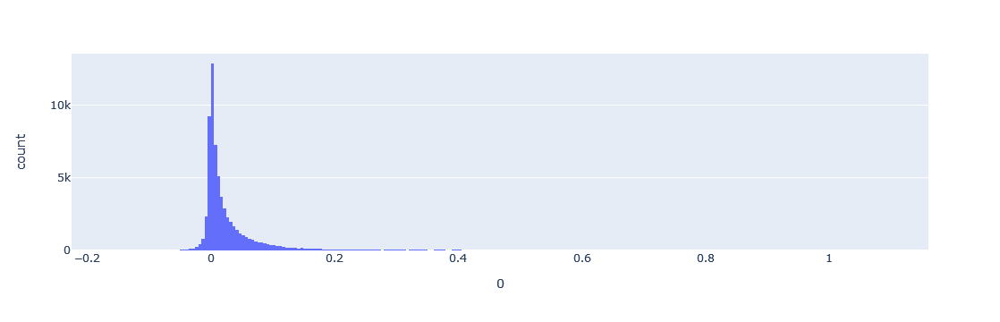

In [148]:
px.histogram(xgb_combined[xgb_combined.Heart_Attack ==0], x=0)

# RandomForest Hyperparameter Tuning

In [167]:
params = [ {'n_estimators': [25, 50, 100, 150], } ]
grid = GridSearchCV(RandomForestRegressor(), params)
grid.fit(X_train, y_train)
print(grid.best_estimator_)

KeyboardInterrupt: 

In [199]:
rfr2 = RandomForestRegressor()
rfr2.fit(X_train, y_train)

RandomForestRegressor()

In [197]:
y_preds = rfr2.predict(X_test)
mean_absolute_error(y_preds, y_test), mean_squared_error(y_preds, y_test)

(0.07988809089527285, 0.038184037594365915)

In [173]:
rfr3 = RandomForestRegressor(n_estimators=50)
rfr3.fit(X_train, y_train)

RandomForestRegressor(n_estimators=50)

In [175]:
y_preds = rfr3.predict(X_test)
mean_absolute_error(y_preds, y_test), mean_squared_error(y_preds, y_test)

(0.08007409940720475, 0.038506235750114)

In [185]:
params = [{
    "max_iter": [50, 100, 150],
    "max_leaf_nodes": [10, 31, 50],
    "learning_rate": [0.01 ,0.1, 0.5],
}]
grid = GridSearchCV(HistGradientBoostingRegressor(), params)
grid.fit(X_train, y_train)
print(grid.best_estimator_)

HistGradientBoostingRegressor(max_leaf_nodes=10)


In [187]:
hgbr2 = HistGradientBoostingRegressor(max_leaf_nodes=10)
hgbr2.fit(X_train, y_train)

HistGradientBoostingRegressor(max_leaf_nodes=10)

In [189]:
y_preds = hgbr2.predict(X_test)
mean_absolute_error(y_preds, y_test), mean_squared_error(y_preds, y_test)

(0.07305802083996178, 0.03655336888555034)

In [191]:
grid.best_params_

{'learning_rate': 0.1, 'max_iter': 100, 'max_leaf_nodes': 10}